# Temperature forecasting project using ML

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
data=pd.read_csv("temp.csv")
data.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [4]:
data.shape

(7752, 25)

In [5]:
data.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [6]:
data['Date']

0       30-06-2013
1       30-06-2013
2       30-06-2013
3       30-06-2013
4       30-06-2013
5       30-06-2013
6       30-06-2013
7       30-06-2013
8       30-06-2013
9       30-06-2013
10      30-06-2013
11      30-06-2013
12      30-06-2013
13      30-06-2013
14      30-06-2013
15      30-06-2013
16      30-06-2013
17      30-06-2013
18      30-06-2013
19      30-06-2013
20      30-06-2013
21      30-06-2013
22      30-06-2013
23      30-06-2013
24      30-06-2013
25      01-07-2013
26      01-07-2013
27      01-07-2013
28      01-07-2013
29      01-07-2013
30      01-07-2013
31      01-07-2013
32      01-07-2013
33      01-07-2013
34      01-07-2013
35      01-07-2013
36      01-07-2013
37      01-07-2013
38      01-07-2013
39      01-07-2013
40      01-07-2013
41      01-07-2013
42      01-07-2013
43      01-07-2013
44      01-07-2013
45      01-07-2013
46      01-07-2013
47      01-07-2013
48      01-07-2013
49      01-07-2013
50      02-07-2013
51      02-07-2013
52      02-0

In [7]:
data.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [8]:
data.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [9]:
data=data.dropna()

In [10]:
data.shape

(7588, 25)

In [11]:
data.isnull().sum().sum()

0

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7588 entries, 0 to 7749
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7588 non-null   float64
 1   Date              7588 non-null   object 
 2   Present_Tmax      7588 non-null   float64
 3   Present_Tmin      7588 non-null   float64
 4   LDAPS_RHmin       7588 non-null   float64
 5   LDAPS_RHmax       7588 non-null   float64
 6   LDAPS_Tmax_lapse  7588 non-null   float64
 7   LDAPS_Tmin_lapse  7588 non-null   float64
 8   LDAPS_WS          7588 non-null   float64
 9   LDAPS_LH          7588 non-null   float64
 10  LDAPS_CC1         7588 non-null   float64
 11  LDAPS_CC2         7588 non-null   float64
 12  LDAPS_CC3         7588 non-null   float64
 13  LDAPS_CC4         7588 non-null   float64
 14  LDAPS_PPT1        7588 non-null   float64
 15  LDAPS_PPT2        7588 non-null   float64
 16  LDAPS_PPT3        7588 non-null   float64
 17  

## FEATURE ENGINEERING

### converting date to float

In [13]:
data.sample(5)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
2630,6.0,12-08-2014,30.4,23.2,68.376884,86.977249,26.049534,23.177875,4.662277,28.284895,0.332574,0.624718,0.628027,0.630864,0.000000,0.001146,0.000000,0.000000,37.5102,127.042,54.6384,0.1457,5100.898926,27.1,22.1
1472,23.0,27-08-2013,29.4,24.2,59.928810,80.410706,28.829644,24.707546,5.738819,74.316349,0.136874,0.267415,0.263873,0.003640,0.000000,0.000000,0.052814,0.000000,37.5372,126.891,15.5876,0.1554,4560.960938,32.4,24.3
4224,25.0,13-08-2015,31.9,25.3,35.955734,77.769913,32.458300,23.593129,6.892647,24.350450,0.111680,0.066000,0.024058,0.035399,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.2713,5058.025879,33.1,23.9
5130,6.0,19-07-2016,31.5,21.2,42.431007,78.562309,32.761640,24.236739,6.511233,53.384421,0.030631,0.162047,0.294036,0.297335,0.000000,0.000000,0.000000,0.000000,37.5102,127.042,54.6384,0.1457,5652.810547,32.7,24.0
39,15.0,01-07-2013,30.1,23.1,64.741501,90.715538,27.650935,22.851294,12.399074,84.724946,0.604813,0.841033,0.773758,0.575775,1.631393,8.088326,0.239777,2.388285,37.5507,126.937,30.0464,0.8552,5861.348633,27.1,20.7


## EDA

In [14]:
data = data.drop(columns=['Date'])

In [15]:
data.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.113301,0.133282,-0.067846,-0.169351,0.069856,0.105277,0.005822,-0.132129,0.006539,0.003526,-0.000161,0.005005,-0.001954,-0.007635,-0.013865,-0.011085,-0.239118,-0.118845,-0.256706,-0.091721,-0.021194,0.107747,0.128184
Present_Tmax,0.113301,1.000000,0.615208,-0.209059,-0.306943,0.573777,0.628705,-0.125952,0.134246,-0.316333,-0.216976,-0.146391,-0.143069,-0.114917,-0.104779,-0.127248,-0.107295,-0.054134,0.007695,-0.189439,-0.107079,-0.022114,0.610357,0.621048
Present_Tmin,0.133282,0.615208,1.000000,0.122200,-0.018576,0.467904,0.772061,-0.038779,-0.012817,0.084348,0.090038,-0.004719,-0.046694,0.111577,0.066207,-0.052428,-0.070391,-0.081417,-0.045174,-0.254084,-0.148423,0.059765,0.463523,0.796975
LDAPS_RHmin,-0.067846,-0.209059,0.122200,1.000000,0.578358,-0.569580,0.085237,0.289422,-0.072195,0.612831,0.744774,0.688069,0.513937,0.259039,0.389572,0.237512,0.167311,0.085027,-0.077590,0.100684,0.122454,0.242168,-0.446824,0.093249
LDAPS_RHmax,-0.169351,-0.306943,-0.018576,0.578358,1.000000,-0.377293,-0.118965,0.131269,0.238986,0.435937,0.390620,0.224734,0.127242,0.268019,0.227581,0.132436,0.118101,0.194820,0.025563,0.176557,0.219436,0.146622,-0.289788,-0.076415
LDAPS_Tmax_lapse,0.069856,0.573777,0.467904,-0.569580,-0.377293,1.000000,0.653425,-0.316011,0.043663,-0.440878,-0.525380,-0.542728,-0.429739,-0.115659,-0.248369,-0.193749,-0.170415,-0.044052,0.091568,-0.181433,-0.163891,0.047414,0.835729,0.589963
LDAPS_Tmin_lapse,0.105277,0.628705,0.772061,0.085237,-0.118965,0.653425,1.000000,-0.134652,-0.139675,0.008714,0.046537,-0.044998,-0.079536,0.034956,-0.002743,-0.093116,-0.103541,-0.099452,-0.024703,-0.198396,-0.187864,0.157763,0.592119,0.886513
LDAPS_WS,0.005822,-0.125952,-0.038779,0.289422,0.131269,-0.316011,-0.134652,1.000000,0.004427,0.285349,0.257226,0.238155,0.218870,0.141503,0.181634,0.147199,0.134428,0.033025,-0.063009,0.188540,0.169223,0.120630,-0.351107,-0.102021
LDAPS_LH,-0.132129,0.134246,-0.012817,-0.072195,0.238986,0.043663,-0.139675,0.004427,1.000000,-0.148314,-0.265382,-0.246709,-0.173156,-0.018708,-0.084375,0.009495,0.012372,0.133309,0.024476,0.056362,0.087517,-0.044956,0.156779,-0.060392
LDAPS_CC1,0.006539,-0.316333,0.084348,0.612831,0.435937,-0.440878,0.008714,0.285349,-0.148314,1.000000,0.779510,0.516698,0.362670,0.446930,0.389368,0.166763,0.088897,-0.010268,-0.007962,-0.017378,-0.023893,0.218285,-0.459705,-0.012877


<Axes: >

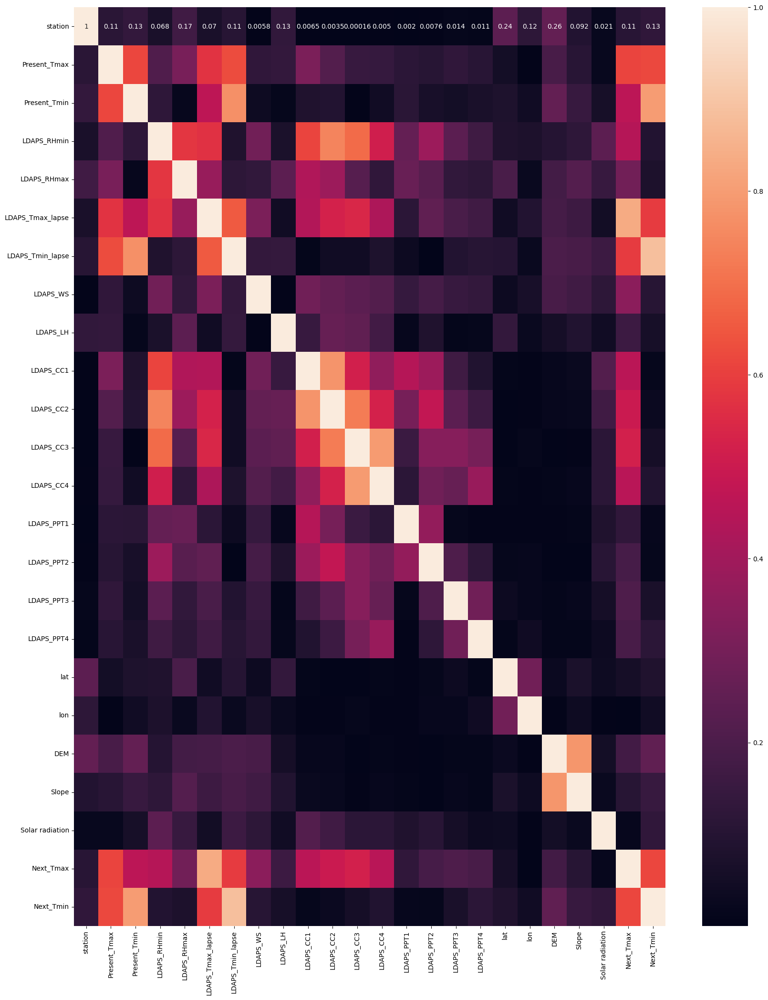

In [16]:
plt.figure(figsize=(20,25))
sns.heatmap(abs(data.corr()),annot=True)

## there can be multicolianerity in so many columns so will check it by vif value

In [18]:
import reverse_geocoder as rg
import pprint
data00=[]
def reversegeocode(coordinates):
    result=rg.search(coordinates)
    return(result)
if __name__=="__main__":
    coordinates=list(zip(data['lat'],data['lon']))
    data12=reversegeocode(coordinates)
    data00.append(data12)
new_data=pd.DataFrame(data00).transpose()

Loading formatted geocoded file...


In [19]:
data['state']=new_data[0].apply(lambda x:x.get('admin1'))
data['Country']=new_data[0].apply(lambda x:x.get('cc'))

In [20]:
data.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,state,Country
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,Seoul,KR
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,Seoul,KR
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,Seoul,KR
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,Seoul,KR
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,Gyeonggi-do,KR


In [21]:
import warnings
warnings.filterwarnings('ignore')

### encoding and cleaning after seeing correlation

In [22]:
data=data.drop(columns=['lat','lon',],axis=1)

In [24]:
from sklearn.preprocessing import LabelEncoder
lab_enc=LabelEncoder()
data['state']=lab_enc.fit_transform(data['state'])
data['Country']=lab_enc.fit_transform(data['Country'])

In [26]:
data['state']

0       1
1       1
2       1
3       1
4       0
5       1
6       0
7       0
8       0
9       0
10      0
11      1
12      0
13      0
14      1
15      1
16      0
17      1
18      1
19      1
20      1
21      0
22      0
23      0
24      1
25      1
26      1
27      1
28      1
29      0
30      1
31      0
32      0
33      0
34      0
35      0
36      1
37      0
38      0
39      1
40      1
41      0
42      1
43      1
44      1
45      1
46      0
47      0
48      0
49      1
50      1
51      1
52      1
53      1
54      0
55      1
56      0
57      0
58      0
59      0
60      0
61      1
62      0
63      0
64      1
65      1
66      0
67      1
68      1
69      1
70      1
71      0
72      0
73      0
74      1
75      1
76      1
77      1
78      1
79      0
80      1
81      0
82      0
83      0
84      0
85      0
86      1
87      0
88      0
89      1
90      1
91      0
92      1
93      1
94      1
95      1
96      0
97      0
98      0
99      1


## data distribution bar graph

In [27]:
data.shape

(7588, 24)

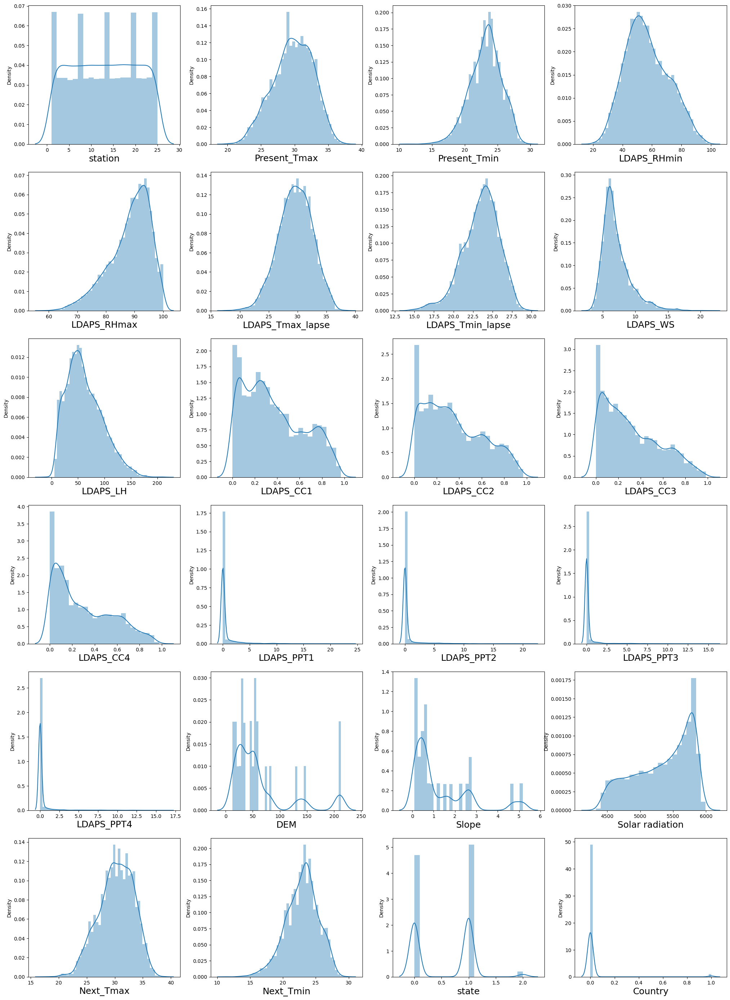

In [29]:
plt.figure(figsize=(25,35))
plotnumber=1

for column in data:
    if plotnumber<=24:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=18)
    plotnumber +=1
plt.show()

In [31]:
data=data.drop(columns=['station','Country'],axis=1)

In [32]:
data.columns

Index(['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'state'],
      dtype='object')

In [33]:
data.describe()

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,state
count,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,0.368510,0.355528,0.317546,0.298268,0.589008,0.480738,0.275007,0.265373,61.918136,1.259755,5343.724208,30.241526,22.910820,0.551265
std,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,0.262260,0.257922,0.249833,0.253392,1.927577,1.743327,1.146087,1.179661,54.323529,1.372748,429.782561,3.111807,2.482256,0.537148
min,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.370000,0.098500,4329.520508,17.400000,11.300000,0.000000
25%,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,0.146546,0.140324,0.100950,0.081495,0.000000,0.000000,0.000000,0.000000,28.700000,0.271300,5001.485717,28.200000,21.300000,0.000000
50%,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,0.315706,0.311676,0.261795,0.227459,0.000000,0.000000,0.000000,0.000000,45.716000,0.618000,5441.987305,30.400000,23.100000,1.000000
75%,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,0.574174,0.557164,0.496444,0.498127,0.052594,0.017735,0.007855,0.000017,59.832400,1.767800,5729.485840,32.600000,24.600000,1.000000
max,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,212.335000,5.178200,5992.895996,38.900000,29.800000,2.000000


In [34]:
data['LDAPS_PPT4'].unique()

array([0.        , 0.84808154, 1.51387392, ..., 3.57477919, 3.34314185,
       3.09381549])

In [35]:
data['LDAPS_PPT3'].unique()

array([0.        , 0.23700432, 0.25371913, ..., 0.09810387, 0.02972079,
       0.02102984])

In [36]:
#### continuous columns
['Present_Tmax','Present_Tmin',	'LDAPS_RHmin',	'LDAPS_RHmax',	'LDAPS_Tmax_lapse',	'LDAPS_Tmin_lapse',	'LDAPS_WS',	
'LDAPS_LH',	'LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4','DEM','Slope','Solar radiation','Next_Tmax','Next_Tmin']

['Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

## checking outliers

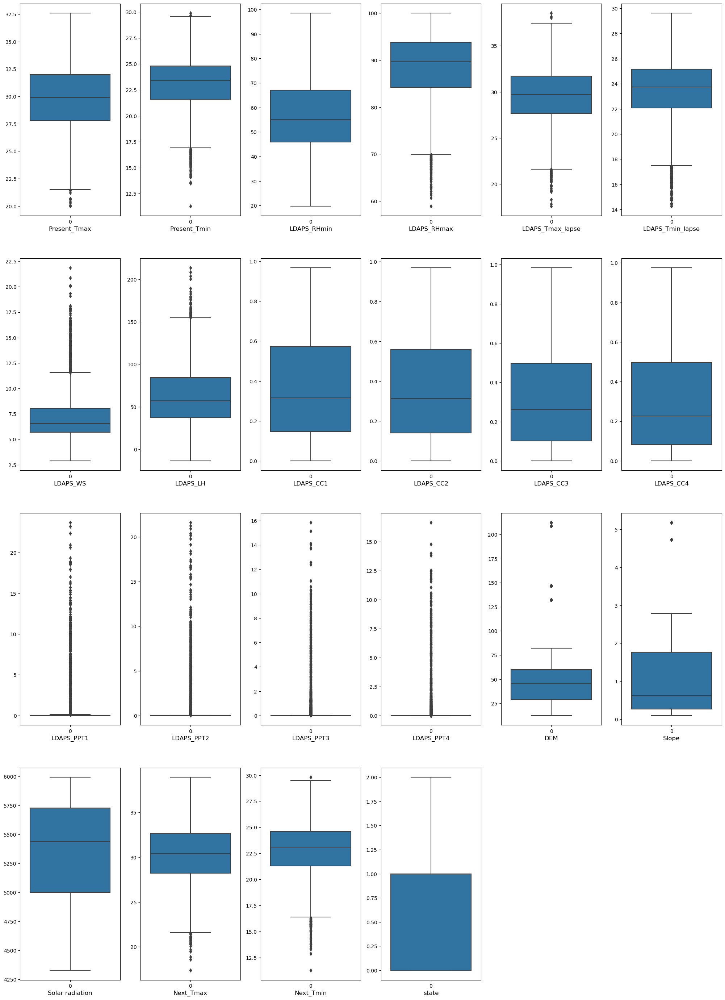

In [37]:
plt.figure(figsize=(25,35))
graph=1
for column in data:
    if graph<=24:
        ax=plt.subplot(4,6,graph)
        sns.boxplot(data=data[column],orient='v')
        plt.xlabel(column,fontsize=12)
    graph+=1
plt.show()

In [39]:
abs(data.corr()['Next_Tmax']).sort_values(ascending=False)

Next_Tmax           1.000000
LDAPS_Tmax_lapse    0.835729
Next_Tmin           0.616629
Present_Tmax        0.610357
LDAPS_Tmin_lapse    0.592119
LDAPS_CC3           0.523061
LDAPS_CC2           0.498295
Present_Tmin        0.463523
LDAPS_CC1           0.459705
LDAPS_CC4           0.454039
LDAPS_RHmin         0.446824
LDAPS_WS            0.351107
LDAPS_RHmax         0.289788
LDAPS_PPT3          0.203554
LDAPS_PPT4          0.190720
LDAPS_PPT2          0.186722
DEM                 0.174578
LDAPS_LH            0.156779
LDAPS_PPT1          0.125954
Slope               0.104279
state               0.085344
Solar radiation     0.016145
Name: Next_Tmax, dtype: float64

In [40]:
abs(data.corr()['Next_Tmin']).sort_values(ascending=False)

Next_Tmin           1.000000
LDAPS_Tmin_lapse    0.886513
Present_Tmin        0.796975
Present_Tmax        0.621048
Next_Tmax           0.616629
LDAPS_Tmax_lapse    0.589963
DEM                 0.249303
Slope               0.148379
state               0.129938
Solar radiation     0.125517
LDAPS_PPT4          0.114900
LDAPS_WS            0.102021
LDAPS_RHmin         0.093249
LDAPS_CC4           0.086197
LDAPS_RHmax         0.076415
LDAPS_PPT3          0.068664
LDAPS_LH            0.060392
LDAPS_CC3           0.056490
LDAPS_CC2           0.030358
LDAPS_PPT1          0.018031
LDAPS_CC1           0.012877
LDAPS_PPT2          0.012462
Name: Next_Tmin, dtype: float64

<Axes: >

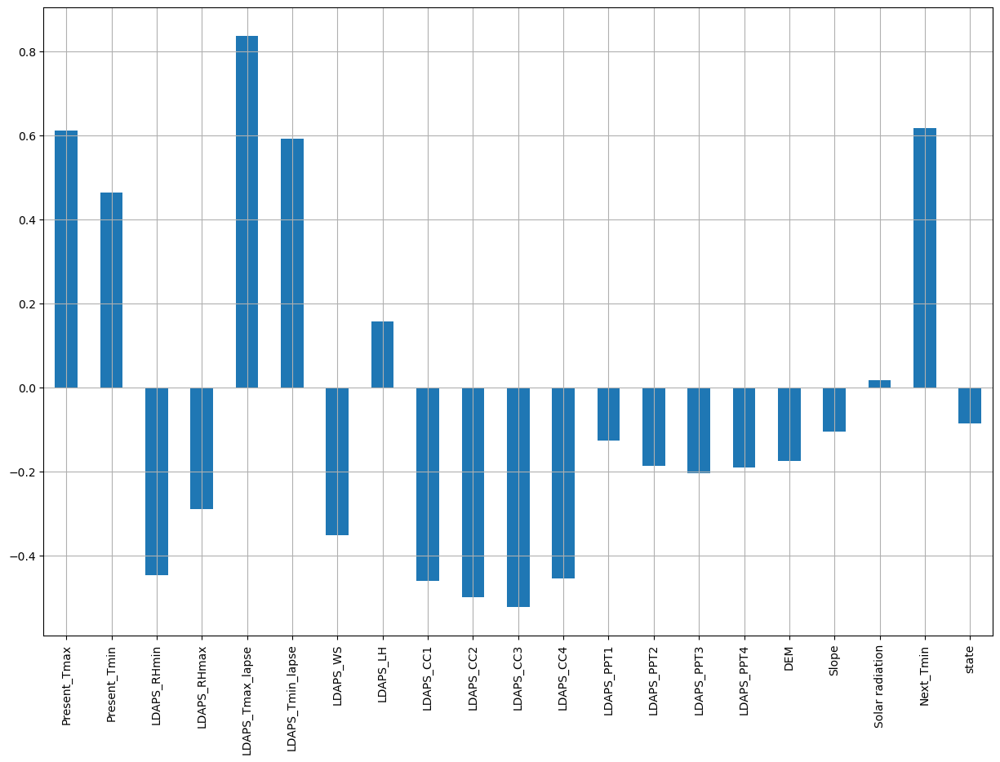

In [41]:
data.drop('Next_Tmax', axis =1).corrwith(data['Next_Tmax']).plot(kind='bar', grid=True, figsize =(15,10))

<Axes: >

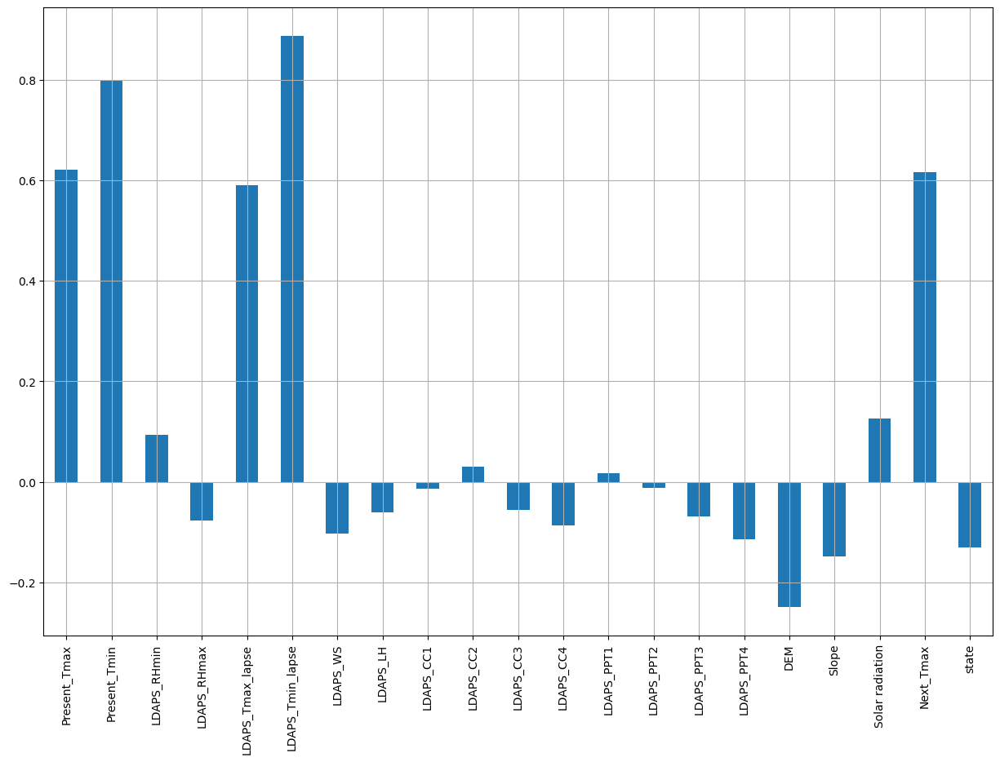

In [42]:
data.drop('Next_Tmin', axis =1).corrwith(data['Next_Tmin']).plot(kind='bar', grid=True, figsize =(15,10))

### REMOVING OUTLIERS 
### INTER QUANTILE RANGE (IQR)

In [43]:
#quantile 1
q1=data.quantile(0.25)
# quantile 3
q3=data.quantile(0.75)

IQR=q3-q1
IQR

Present_Tmax          4.200000
Present_Tmin          3.200000
LDAPS_RHmin          21.154856
LDAPS_RHmax           9.539001
LDAPS_Tmax_lapse      4.037353
LDAPS_Tmin_lapse      3.068840
LDAPS_WS              2.353603
LDAPS_LH             47.029465
LDAPS_CC1             0.427627
LDAPS_CC2             0.416839
LDAPS_CC3             0.395495
LDAPS_CC4             0.416632
LDAPS_PPT1            0.052594
LDAPS_PPT2            0.017735
LDAPS_PPT3            0.007855
LDAPS_PPT4            0.000017
DEM                  31.132400
Slope                 1.496500
Solar radiation     728.000123
Next_Tmax             4.400000
Next_Tmin             3.300000
state                 1.000000
dtype: float64

In [45]:
Pt_Tmax=(q3.Present_Tmax-1.5*IQR.Present_Tmax)
print(Pt_Tmax)
index=np.where(data['Present_Tmax']<Pt_Tmax)
data=data.drop(data.index[index])
print(data.shape)
data.reset_index()

25.700000000000003
(6754, 22)


,index,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,state
0,0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,2.038957e-01,1.616969e-01,1.309282e-01,0.000000,0.000000,0.000000,0.000000,212.3350,2.7850,5992.895996,29.1,21.2,1
1,1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,2.517714e-01,1.594441e-01,1.277273e-01,0.000000,0.000000,0.000000,0.000000,44.7624,0.5141,5869.312500,30.5,22.5,1
2,2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,2.574694e-01,2.040915e-01,1.421253e-01,0.000000,0.000000,0.000000,0.000000,33.3068,0.2661,5863.555664,31.1,23.9,1
3,3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,2.260024e-01,1.611574e-01,1.342487e-01,0.000000,0.000000,0.000000,0.000000,45.7160,2.5348,5856.964844,31.7,24.3,1
4,4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,2.499953e-01,1.788925e-01,1.700210e-01,0.000000,0.000000,0.000000,0.000000,35.0380,0.5055,5859.552246,31.2,22.5,0
5,5,31.9,23.5,52.437126,85.307251,29.219342,23.822613,6.182295,50.231389,0.185279,2.808180e-01,2.328410e-01,1.463629e-01,0.000000,0.000000,0.000000,0.000000,54.6384,0.1457,5873.780762,31.5,24.0,1
6,6,31.4,24.4,56.287189,81.019760,28.551859,24.238467,5.587135,125.110007,0.389600,3.335700e-01,2.704190e-01,1.457054e-01,0.000000,0.000000,0.000000,0.000000,12.3700,0.0985,5849.233398,30.9,23.4,0
7,7,32.1,23.6,52.326218,78.004539,28.851982,23.819054,6.104417,42.011547,0.357856,3.449281e-01,2.723873e-01,1.438406e-01,0.000000,0.000000,0.000000,0.000000,52.5180,1.5629,5863.992188,31.1,22.9,0
8,8,31.4,22.0,55.338791,80.784607,28.426975,23.332373,6.017135,85.110971,0.408766,3.448003e-01,2.649796e-01,1.489111e-01,0.000000,0.000000,0.000000,0.000000,50.9312,0.4125,5876.901367,31.3,21.6,0
9,9,31.6,20.5,56.651203,86.849632,27.576705,22.527018,6.518841,63.006075,0.348292,3.062548e-01,2.452542e-01,1.354435e-01,0.000000,0.000000,0.000000,0.000000,208.5070,5.1782,5893.608398,30.5,21.0,0


In [47]:
data.columns

Index(['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'state'],
      dtype='object')

In [48]:
X= data.drop(columns=['Next_Tmax','Next_Tmin'], axis=1)
y1=data['Next_Tmax']
y2=data['Next_Tmin']

In [49]:
x=X

### data normallisation

In [50]:
features = ['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin','LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4','DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin']
from sklearn.preprocessing import power_transform
X=power_transform(X,method='yeo-johnson')
X= pd.DataFrame(X,columns=x.columns)

## data standardisation

In [52]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)

## vif for multi colinearity

In [53]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif"]=[variance_inflation_factor(X_scaled,i) for i in range(X_scaled.shape[1])]
vif["Features"]=X.columns
vif

,vif,Features
0,11.443385,Present_Tmax
1,47.571322,Present_Tmin
2,63.292039,LDAPS_RHmin
3,17.585197,LDAPS_RHmax
4,49.828840,LDAPS_Tmax_lapse
5,58.082311,LDAPS_Tmin_lapse
6,19.987225,LDAPS_WS
7,53.192628,LDAPS_LH
8,17.033554,LDAPS_CC1
9,19.330707,LDAPS_CC2


### to remove multicolinearity problem PCA is applied 

## PCA

In [54]:
from sklearn.decomposition import PCA
for i in range(2,19):
    pca=PCA(n_components=i)
    principalComponents = pca.fit_transform(X)
    print(i,sum(pca.explained_variance_ratio_))

2 0.4302885584252829
3 0.5416563000597691
4 0.618325474822859
5 0.6848355202755271
6 0.7425787478003476
7 0.7927087646497223
8 0.8370865041298815
9 0.8748813968073839
10 0.9043575438191396
11 0.9283066914640834
12 0.9416759707356901
13 0.9546931126869219
14 0.9669524866528991
15 0.9767816797321439
16 0.9840671996290472
17 0.9904603437538916
18 0.9946716809335869


### n_components=13

In [56]:
pca = PCA(n_components=13)
principalComponents = pca.fit_transform(X)
X = pd.DataFrame(principalComponents)

In [57]:
X

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.288341,0.744803,-0.025553,0.151167,-0.359089,0.139440,0.109290,0.353240,0.106089,0.045986,-0.000041,-0.091925,-0.060262
1,-0.347492,0.011283,-0.070928,0.241188,-0.242922,0.073277,0.111561,0.336923,0.100616,0.070768,-0.077339,-0.135336,-0.055614
2,-0.363231,-0.240711,-0.031739,0.274248,-0.275305,0.039962,0.149665,0.323863,0.084141,-0.024636,0.065946,-0.130933,-0.035263
3,-0.300809,0.423260,-0.067235,0.183095,-0.194123,0.007628,0.142607,0.301715,0.120067,0.174820,-0.295063,0.056957,0.147635
4,-0.330754,-0.105588,-0.045890,-0.370734,-0.241347,0.101651,0.030557,0.275073,0.059397,0.004785,-0.160570,-0.130259,0.009872
5,-0.326911,-0.206009,-0.011364,0.269297,-0.294535,0.049898,0.125082,0.330959,0.092449,-0.030333,0.005566,-0.322830,-0.155504
6,-0.198531,-0.700425,-0.135122,-0.295480,-0.304848,0.059684,0.034079,0.232867,0.164316,0.050106,0.060938,-0.064326,0.156584
7,-0.221447,0.158959,-0.028279,-0.386908,-0.284797,-0.139678,0.215955,0.171925,0.098143,-0.034258,0.249190,-0.076356,0.149153
8,-0.182337,-0.126773,-0.076010,-0.352097,-0.338673,0.013415,0.088868,0.205694,0.131190,-0.004948,0.207887,-0.240786,-0.043401
9,-0.191573,0.700198,-0.015743,-0.450138,-0.300377,-0.071477,0.158685,0.178533,0.095165,0.003758,0.153647,-0.194493,0.049684


## Model Training(Next_Tmax prediction)

#### Linear Regression

In [58]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.model_selection import train_test_split

In [59]:
for i in range(0,1000):
    x_train,x_test,y_train,y_test = train_test_split(X,y1,test_size=0.20, random_state=i)
    lr.fit(x_train,y_train)
    pred_train = lr.predict(x_train)
    pred_test = lr.predict(x_test)
    if round(r2_score(y_train,pred_train)*100,1) == round(r2_score(y_test,pred_test)*100,1):
        print("At random state",i,"model perform very well")
        print("At random state",i)
        print('Training accuracy score is', r2_score(y_train,pred_train)*100)
        print('Testing accuracy score is', r2_score(y_test,pred_test)*100)

At random state 346 model perform very well
At random state 346
Training accuracy score is 71.84816908878805
Testing accuracy score is 71.84292572401185
At random state 347 model perform very well
At random state 347
Training accuracy score is 71.8532833732916
Testing accuracy score is 71.8664965196411
At random state 404 model perform very well
At random state 404
Training accuracy score is 71.8198114806472
Testing accuracy score is 71.83675879250674
At random state 425 model perform very well
At random state 425
Training accuracy score is 71.85079948313593
Testing accuracy score is 71.87505168712869
At random state 546 model perform very well
At random state 546
Training accuracy score is 71.84956617129798
Testing accuracy score is 71.7619363562656
At random state 581 model perform very well
At random state 581
Training accuracy score is 71.84064015884866
Testing accuracy score is 71.81666416383736
At random state 679 model perform very well
At random state 679
Training accuracy scor

In [61]:
## y2 prediction
for i in range(0,1000):
    x_train,x_test,y_train,y_test = train_test_split(X,y2,test_size=0.20, random_state=i)
    lr.fit(x_train,y_train)
    pred_train = lr.predict(x_train)
    pred_test = lr.predict(x_test)
    if round(r2_score(y_train,pred_train)*100,1) == round(r2_score(y_test,pred_test)*100,1):
        print("At random state",i,"model perform very well")
        print("At random state",i)
        print('Training accuracy score is', r2_score(y_train,pred_train)*100)
        print('Testing accuracy score is', r2_score(y_test,pred_test)*100)

At random state 22 model perform very well
At random state 22
Training accuracy score is 76.3411084927993
Testing accuracy score is 76.26940076713666
At random state 149 model perform very well
At random state 149
Training accuracy score is 76.34124051101429
Testing accuracy score is 76.34935039873032
At random state 178 model perform very well
At random state 178
Training accuracy score is 76.32259897124187
Testing accuracy score is 76.31035445480524
At random state 309 model perform very well
At random state 309
Training accuracy score is 76.3425146279336
Testing accuracy score is 76.30264815851108
At random state 328 model perform very well
At random state 328
Training accuracy score is 76.34748572217521
Testing accuracy score is 76.34920333938182
At random state 342 model perform very well
At random state 342
Training accuracy score is 76.34754807009931
Testing accuracy score is 76.33554251631558
At random state 619 model perform very well
At random state 619
Training accuracy scor

### Random_state for y1= 843
### Random_state for y2= 949

In [62]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(X,y1,test_size=0.20,random_state=843)

In [63]:
x_train2,x_test2,y_train2,y_test2 = train_test_split(X,y2,test_size=0.20,random_state=949)

In [68]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error,SCORERS
import scikitplot as skplt

72.56615633412011
1.1796062494156603
RMSE : 1.523859950825482


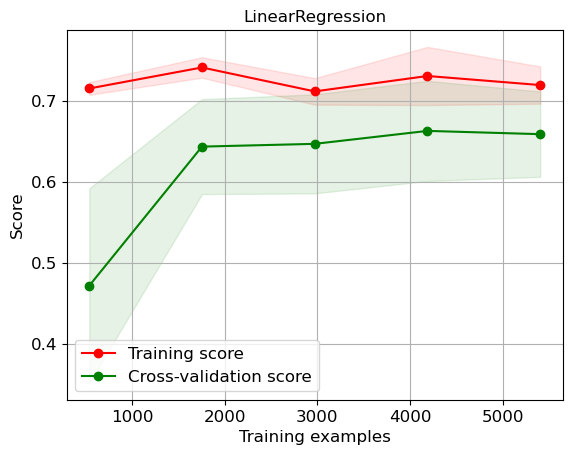

None


In [69]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
lr = LinearRegression()
lr.fit(x_train,y_train)
pred = lr.predict(x_test)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test,pred))
mse = mean_squared_error(y_test,pred)
print('RMSE :' , np.sqrt(mse))
skplt.estimators.plot_learning_curve(lr,X,y1,cv=5,scoring='r2',text_fontsize='large',title = 'LinearRegression')
print(plt.show())

-711.578274974747
0.8849170811375415
RMSE : 1.1219553297304152


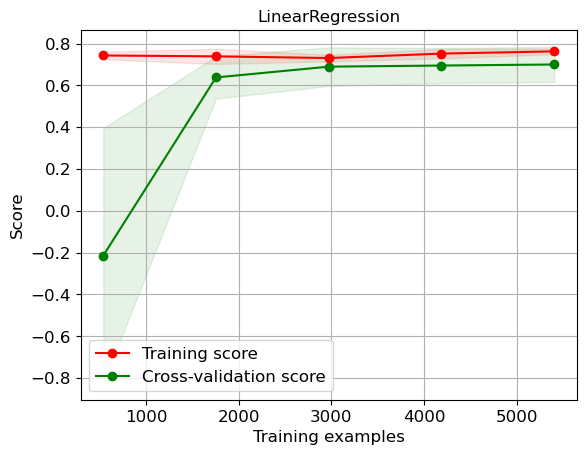

None


In [71]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
lr = LinearRegression()
lr.fit(x_train2,y_train2)
pred = lr.predict(x_test2)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test2,pred))
mse = mean_squared_error(y_test2,pred)
print('RMSE :' , np.sqrt(mse))
skplt.estimators.plot_learning_curve(lr,X,y2,cv=5,scoring='r2',text_fontsize='large',title = 'LinearRegression')
print(plt.show())

## Random Forest

85.43276807204212
0.8419489267209471
RMSE: 1.1104275878377825


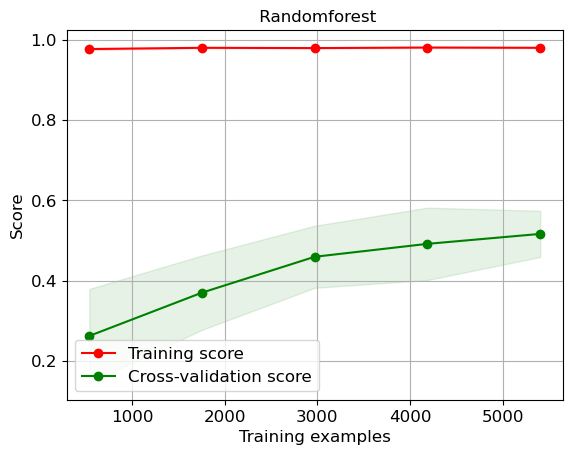

None


In [75]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(x_train,y_train)
pred = rf.predict(x_test)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test,pred))
mse = mean_squared_error(y_test,pred)
print('RMSE:', np.sqrt(mse))
skplt.estimators.plot_learning_curve(rf,X,y1,cv=5,scoring= 'r2', text_fontsize= 'large', title=' Randomforest')
print(plt.show())

83.27865256398532
0.7342938564026645
RMSE: 0.9426840293155351


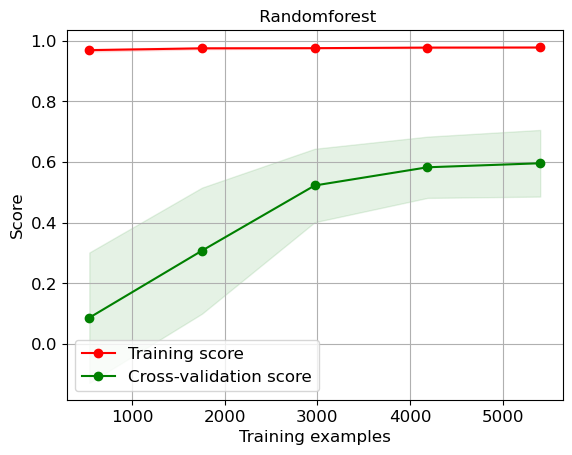

None


In [76]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(x_train2,y_train2)
pred = rf.predict(x_test2)
print(r2_score(y_test2,pred)*100)
print(mean_absolute_error(y_test2,pred))
mse = mean_squared_error(y_test2,pred)
print('RMSE:', np.sqrt(mse))
skplt.estimators.plot_learning_curve(rf,X,y2,cv=5,scoring= 'r2', text_fontsize= 'large', title=' Randomforest')
print(plt.show())

78.00034460518982
1.0631778074082525
RMSE: 1.3646135038718057


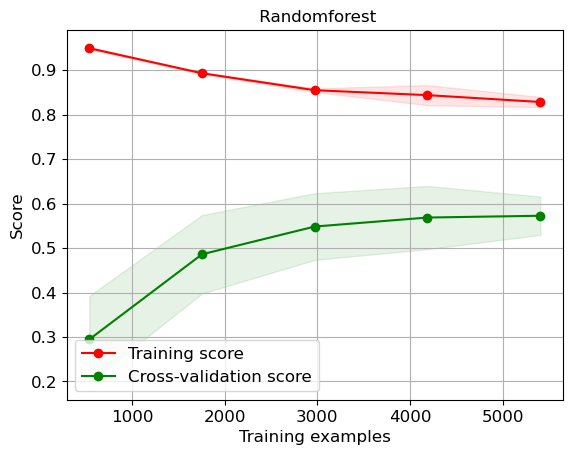

None


In [77]:
from sklearn.ensemble import GradientBoostingRegressor
gb = GradientBoostingRegressor()
gb.fit(x_train,y_train)
pred = gb.predict(x_test)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test,pred))
mse = mean_squared_error(y_test,pred)
print('RMSE:', np.sqrt(mse))
skplt.estimators.plot_learning_curve(gb,X,y1,cv=5,scoring= 'r2', text_fontsize= 'large', title=' Randomforest')
print(plt.show())

78.00034460518982
1.0631778074082525
RMSE: 1.3646135038718057


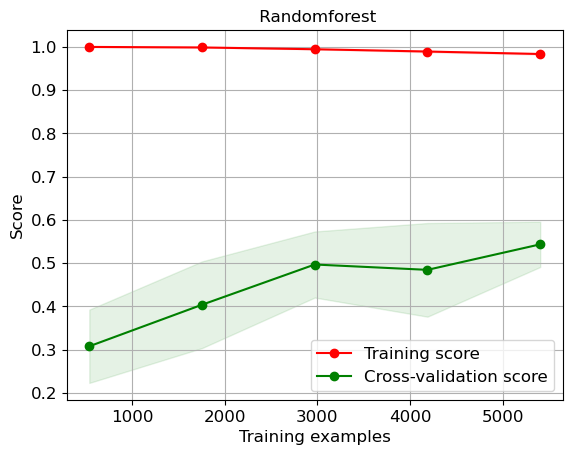

None


In [80]:
from xgboost import XGBRegressor
xgbt = XGBRegressor()
xgbt.fit(x_train,y_train)
pred = gb.predict(x_test)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test,pred))
mse = mean_squared_error(y_test,pred)
print('RMSE:', np.sqrt(mse))
skplt.estimators.plot_learning_curve(xgbt,X,y1,cv=5,scoring= 'r2', text_fontsize= 'large', title=' Randomforest')
print(plt.show())

## Random forest - Hypertuning Gridsearchcv

In [82]:
rf.estimator_params

('criterion',
 'max_depth',
 'min_samples_split',
 'min_samples_leaf',
 'min_weight_fraction_leaf',
 'max_features',
 'max_leaf_nodes',
 'min_impurity_decrease',
 'random_state',
 'ccp_alpha')

In [86]:
from sklearn.model_selection import GridSearchCV
x_train,x_test,y_train,y_test = train_test_split(X,y1,test_size=0.20,random_state=912)
params = {'n_estimators':range(100,120,10), 
          'min_samples_split':range(2,4),
          'min_samples_leaf':range(1,2,1)
         }
GCV2 = GridSearchCV(rf,param_grid = params)
GCV2.fit(x_train,y_train)
print('best_pram', GCV2.best_params_)
rf = GCV2.best_estimator_

rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)

print('\nR2score =>' , '\n', r2_score(y_test,y_pred)*100)
print(mean_absolute_error(y_test,y_pred))
mse = mean_squared_error(y_test,y_pred)
print('RMSE:', np.sqrt(mse))

best_pram {'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

R2score => 
 83.98810854137055
0.8566868985936343
RMSE: 1.1453850231347178


### after hyperparameter and cross validation, chose random forest as best model

In [88]:
import joblib
joblib.dump(GCV2.best_estimator_,'Temperature prediction Next_Tmax2.pkl')

['Temperature prediction Next_Tmax2.pkl']

In [89]:
from sklearn.model_selection import GridSearchCV
x_train,x_test,y_train,y_test = train_test_split(X,y2,test_size=0.20,random_state=912)
params = {'n_estimators':range(100,120,10), 
          'min_samples_split':range(2,4),
          'min_samples_leaf':range(1,2,1)
         }
GCV2 = GridSearchCV(rf,param_grid = params)
GCV2.fit(x_train,y_train)
print('best_pram', GCV2.best_params_)
rf = GCV2.best_estimator_

rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)

print('\nR2score =>' , '\n', r2_score(y_test,y_pred)*100)
print(mean_absolute_error(y_test,y_pred))
mse = mean_squared_error(y_test,y_pred)
print('RMSE:', np.sqrt(mse))

best_pram {'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 110}

R2score => 
 83.92867134700894
0.7104622838301594
RMSE: 0.9232394952166152


In [90]:
import joblib
joblib.dump(GCV2.best_estimator_,'Temperature prediction Next_Tmin2.pkl')

['Temperature prediction Next_Tmin2.pkl']

In [91]:
model= joblib.load("Temperature prediction next_Tmin2.pkl")
y_preds = model.predict(x_test)
predicted = pd.DataFrame(y_preds,columns=['predicted'])
predicted

,predicted
0,24.558182
1,25.659091
2,18.823636
3,21.828182
4,23.508182
5,24.530000
6,21.629091
7,25.983636
8,26.158182
9,23.230000


In [92]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(X,y1,test_size=0.20,random_state=843)

In [94]:
model_max= joblib.load("Temperature prediction next_Tmax2.pkl")
y_preds = model.predict(x_test)
predicted_max = pd.DataFrame(y_preds,columns=['predicted'])
predicted_max

,predicted
0,22.020909
1,23.350909
2,23.530000
3,23.749091
4,22.100909
5,21.898182
6,19.523636
7,25.574545
8,20.034545
9,26.030909


In [95]:
predicted.to_csv("Next_tmin.csv", index=False)